# 🧪 Visualizador de Orbitais Moleculares (HOMO/LUMO)

Este notebook carrega arquivos `.cube` gerados com ORCA e exibe os orbitais HOMO e LUMO em 3D usando **Py3Dmol**.

**Requisitos:**
- `py3Dmol`
- Arquivos `.cube` dos orbitais (ex: HOMO.cube, LUMO.cube)
- Arquivo `.out` do ORCA com as energias dos orbitais


In [238]:
import py3Dmol
import os


In [ ]:
# Caminhos dos arquivos
homo_cube = r"SEU_ARQUIVO_ORBITAL_HOMO.cube"
lumo_cube = r"SEU_ARQUIVO_ORBITAL_LUMO.cube"
saida_orca = r"SEU_ARQUIVO.out"

## 📦 Função para visualizar orbitais a partir de `.cube`

In [240]:
def visualizar_orbital(cube_path, isosurface=0.01):
    view = py3Dmol.view(width=500, height=500)
    with open(cube_path, 'r') as f:
        cube_data = f.read()
    view.addModel(cube_data, 'cube')
    view.setStyle({'stick': {}})
    view.addVolumetricData(cube_data, "cube", {'isoval': isosurface, 'color': 'blue', 'opacity': 0.8})
    view.addVolumetricData(cube_data, "cube", {'isoval': -isosurface, 'color': 'red', 'opacity': 0.8})
    view.zoomTo()
    return view

## 📤 Função para extrair energias dos orbitais do `.out` do ORCA

In [241]:
def extrair_energias_orbitais_eV(out_path):
    homo_energy = None
    lumo_energy = None
    orbitais = []

    with open(out_path, 'r') as f:
        lines = f.readlines()

    # Buscar pela seção de energias
    for i, line in enumerate(lines):
        if 'ORBITAL ENERGIES' in line:
            for j in range(i + 4, len(lines)):
                l = lines[j].strip()
                if not l:
                    break  # linha vazia => fim da seção
                partes = l.split()
                if len(partes) >= 4:
                    try:
                        ocupacao = float(partes[1])
                        energia_ev = float(partes[3])
                        orbitais.append((ocupacao, energia_ev))
                    except ValueError:
                        continue
            break

    # Separar orbitais ocupados e desocupados
    ocupados = [e for o, e in orbitais if o > 0]
    desocupados = [e for o, e in orbitais if o == 0]

    if ocupados:
        homo_energy = ocupados[-1]
    if desocupados:
        lumo_energy = desocupados[0]

    return homo_energy, lumo_energy


## 🧪 Visualização e cálculo
Substitua os caminhos abaixo pelos nomes corretos dos seus arquivos.

In [242]:
# Visualizar HOMO
print("🔵 HOMO:")
visualizar_orbital(homo_cube).show()

🔵 HOMO:


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [243]:
# Visualizar LUMO
print("🔴 LUMO:")
visualizar_orbital(lumo_cube).show()

🔴 LUMO:


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [244]:
def plotar_diagrama_orbitais(homo: float, lumo: float) -> None:
    import matplotlib.pyplot as plt

    # Garantir margem mínima
    margem = max(0.5, abs(lumo - homo) * 0.4)

    plt.figure(figsize=(5, 6))
    plt.axhline(y=homo, color='blue', linewidth=2, label=f'HOMO ({homo:.2f} eV)')
    plt.axhline(y=lumo, color='red', linewidth=2, label=f'LUMO ({lumo:.2f} eV)')

    # Gap
    plt.annotate(
        '', xy=(0.2, lumo), xytext=(0.2, homo),
        arrowprops=dict(arrowstyle='<->', color='gray', lw=2)
    )
    plt.text(
        0.25, (homo + lumo) / 2,
        f'GAP = {lumo - homo:.2f} eV',
        va='center', ha='left', fontsize=10, color='gray'
    )

    # Eixo y com margem automática
    plt.ylim(min(homo, lumo) - margem, max(homo, lumo) + margem)
    plt.xlim(0, 1)
    plt.axis('off')
    plt.title('Diagrama de Orbitais Moleculares', fontsize=14)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()


Energia HOMO: -8.038 eV
Energia LUMO: 2.898 eV
GAP HOMO–LUMO: 10.936 eV


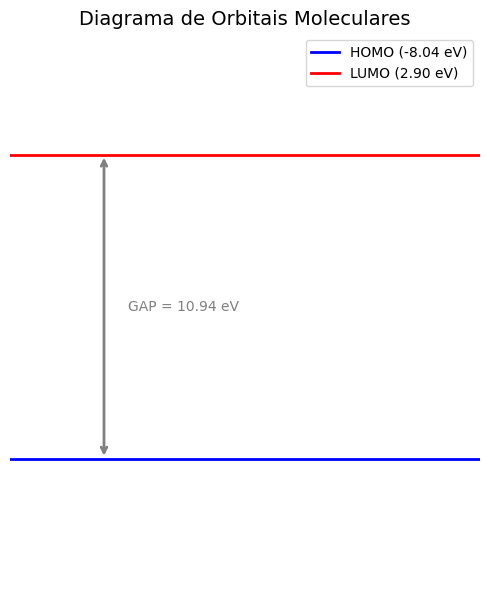

In [245]:
homo, lumo = extrair_energias_orbitais_eV(saida_orca)

if homo is not None and lumo is not None:
    print(f"Energia HOMO: {homo:.3f} eV")
    print(f"Energia LUMO: {lumo:.3f} eV")
    print(f"GAP HOMO–LUMO: {lumo - homo:.3f} eV")
    plotar_diagrama_orbitais(homo, lumo)
else:
    print("⚠️ Não foi possível extrair as energias dos orbitais.")

